In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
df_train = pd.read_pickle("./nhanes/df_train.pkl")
df_validation = pd.read_pickle("./nhanes/df_validation.pkl")
df_test = pd.read_pickle("./nhanes/df_test.pkl")

In [3]:
df_train.columns

Index(['Cycle', 'Age', 'Gender', 'Education', 'Ethnicity', 'InterviewWeight',
       'HyperHist', 'ChestPain', 'Shortness', 'Milk', 'FeltDown',
       'Suicidality', 'FeltBad', 'WeakKidneys', 'UrineLeak', 'HoursWorked',
       'Dental', 'Pesticides', 'PregnantEver', 'HoursSlept', 'Smoke100',
       'SmokeNow', 'MaxWeight', 'LegLen', 'ArmCirc', 'Weight', 'BMI', 'Waist',
       'ArmLen', 'Pulse', 'SessionTime', 'FoodFastHours', 'HHIncome',
       'MealsOut', 'ReadytoEat', 'Frozen', 'KidneyStones', 'ModWork', 'VigRec',
       'VigWork', 'ModRec', 'WalkBike', 'Systolic', 'Diastolic', 'DiabHistAge',
       'AgeGroup'],
      dtype='object')

## Create target variable from Systolic and Diastolic variables

First let us visualise the columns constructing the target variable, the diastolic and systolic blood pressure, colored by the SP past hypertension diagnosis.

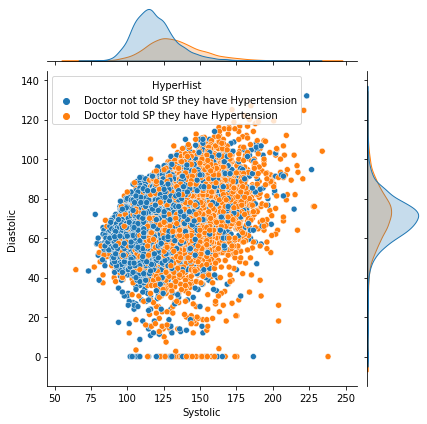

In [4]:
df = df_train.copy()
df.loc[df['HyperHist'] == 0,'HyperHist'] = 'Doctor not told SP they have Hypertension'
df.loc[df['HyperHist'] == 1,'HyperHist'] = 'Doctor told SP they have Hypertension'
ax = sns.jointplot(data = df, x = 'Systolic',y = 'Diastolic',hue = 'HyperHist')


The above plot shows the two classes have some overlap, it is also difficult to see the variation of density over space. We recreate the visual with a KDE plot. 

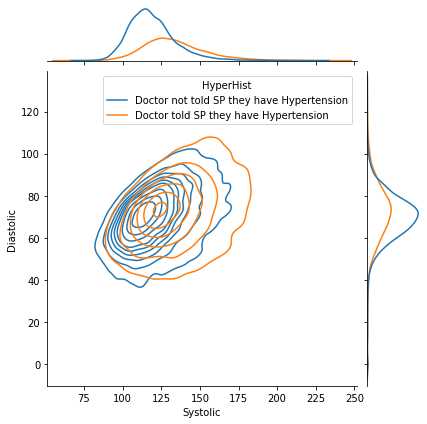

In [5]:
ax = sns.jointplot(data = df, x = 'Systolic',y = 'Diastolic',hue = 'HyperHist',kind="kde")

1. Observing the histogram plots on the sides we see that the systolic blood pressure correlates much more strongly with the SPs history of hypertension than does diastolic blood pressure. Indeed, the distribution of diastolic blood pressure for SPs told they have hypertension seems quite similar to the diastolic blood pressure distribution for SPs not told they have hypertension. We will evaluate predictive models for both 'HyperSystolic' as well as 'HyperDiastolic' to see which may be best predicted.


2. Note the presence of SPs with extreme low Systolic / Diastolic pressure. This can be due to complicating diseases such as artial stiffness, excess adipose tissue, or other complicating factors which inhibits the readings from the prescribed device. Consulting the documentation of the Systolic and Diastolic readings we find the rigorous survey methods indicate to record such unlikely results when they do occur.


Viewing the density plot on the sides of the scatterplot show that such very low readings are very rare and can be resonably dropped from our data.

We will remove these very low readings from the data.


Now we define the Hypertension Target variable, based on the guidelines for diagnosing hypertension from blood pressure readings.

  * 0 -- Non-Hypertensive
  * 1 -- Hypertensive
  

### Anomoly detection to drop outlying records

Isolation forest is used to detect outliers, at the 3% level very low diastolic measurements are dropped.

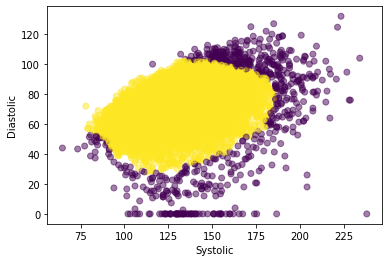

In [6]:
from sklearn.ensemble import IsolationForest
systolic_diastolic_array = df_train[['Systolic','Diastolic']].to_numpy()

inlier_clf = IsolationForest(contamination=0.03).fit(systolic_diastolic_array)
inliers = inlier_clf.predict(systolic_diastolic_array)


plt.scatter(systolic_diastolic_array[:,0],
            systolic_diastolic_array[:,1],
            c=inliers, alpha=0.5)
plt.xlabel('Systolic')
plt.ylabel('Diastolic')
plt.show()

We use this classifier to drop outliers in the data sets.

In [7]:
def drop_outliers(df,cols,clf):
    X = df[cols]
    assert X.shape[1] == clf.n_features_, 'Shape mismatch'

    Y = clf.predict(X)

    df.drop(df[-(pd.DataFrame(Y,index = df.index) == 1)[0]].index,inplace=True) 

    

In [8]:
bp_cols = ['Systolic','Diastolic']
drop_outliers(df_train,bp_cols,inlier_clf)
drop_outliers(df_validation,bp_cols,inlier_clf)
drop_outliers(df_test,bp_cols,inlier_clf)

### Engineering The Target Variables

In [9]:
def create_feature(df,columns,thresholds,new_feat):
    '''Feature==1  if any column values above threshold.'''
    zipped = zip(columns,thresholds)
    col_v_thresh_lst = [df[c].apply(lambda x: x>t) for c,t in zipped]

    df[new_feat] = (pd.DataFrame(col_v_thresh_lst).T).any(axis=1).astype(int)

In [10]:
create_feature(df_train,bp_cols,[130,80],'Hypertensive')
create_feature(df_validation,bp_cols,[130,80],'Hypertensive')
create_feature(df_test,bp_cols,[130,80],'Hypertensive')

### Visualize the construction of the target variable

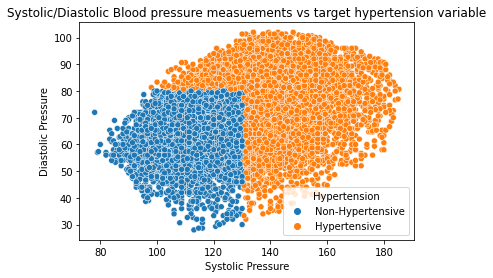

In [11]:

ax = sns.scatterplot(data = df_train, x = 'Systolic',y = 'Diastolic',hue = 'Hypertensive')
ax.legend_.set_title('Hypertension') 
ax.set_xlabel('Systolic Pressure')
ax.set_ylabel('Diastolic Pressure')
HT_labels = ['Non-Hypertensive','Hypertensive']
for t, l in zip(ax.legend_.texts, HT_labels): t.set_text(l)
ax.set_title('Systolic/Diastolic Blood pressure measuements vs target hypertension variable')
plt.show()

### Distribution of Hypertensive variable

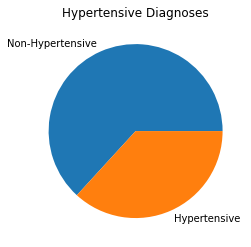

In [12]:
diag_totals = df_train['Hypertensive'].value_counts().sort_index().to_numpy()
HT_perc = 100*diag_totals/diag_totals.sum()
fig1, ax1 = plt.subplots()
ax1.pie(HT_perc,labels = HT_labels)
ax1.set_title('Hypertensive Diagnoses')
plt.show()

####  Hypertensive target features are imbalanced

The classes are imbalanced with respect to each target variable, we will balance the datasets by downsampling during the ML Algorithm phase.

## Is the proportion of hypertension increasing over time? 

In [57]:
from statsmodels.stats.proportion import proportions_ztest

df = df_train[df_train['Age']>50]

contingency_table = pd.crosstab(df_train['Hypertensive'],df_train['Cycle'])

cycle5_ht = contingency_table.loc[1,5]
cycle10_ht = contingency_table.loc[1,10]
cycle5_pop = contingency_table.sum()[5]
cycle10_pop = contingency_table.sum()[10]

ht = np.array([cycle5_ht,cycle10_ht])
pop = np.array([cycle5_pop,cycle10_pop])
stat, p_value = proportions_ztest(count=ht, nobs=pop,  alternative='smaller')

print('z_stat: ', stat,', p_value: ', p_value)

z_stat:  -5.0944178942817 , p_value:  1.7490719664410827e-07


In [63]:
prop = ht/pop
perc_change = 100*(prop[1]/prop[0] - 1)
print(f'The rate of hypertension for SPs over 50 has increased by {perc_change:.2f}% from  2007 (cycle 5) to 2017 (cycle 10).')

The rate of hypertension for SPs over 50 has increased by 16.87% from  2007 (cycle 5) to 2017 (cycle 10).


With a p value below 1% we can conclude statistically the rate of hypertension has increased in the over 50 population from 2007 to 2017.

## Drop Features and save datasets

We drop features not used in predictive analysis, such as cycle, and to prevent data leakage, such as Systolic and Diastolic.

In [65]:
cols_to_drop = ['Cycle','InterviewWeight','SessionTime','Systolic','Diastolic','AgeGroup']

df_train.drop(cols_to_drop,axis = 1,inplace = True)
df_validation.drop(cols_to_drop,axis = 1,inplace = True)
df_test.drop(cols_to_drop,axis = 1,inplace = True)

df_train.columns

Index(['Age', 'Gender', 'Education', 'Ethnicity', 'HyperHist', 'ChestPain',
       'Shortness', 'Milk', 'FeltDown', 'Suicidality', 'FeltBad',
       'WeakKidneys', 'UrineLeak', 'HoursWorked', 'Dental', 'Pesticides',
       'PregnantEver', 'HoursSlept', 'Smoke100', 'SmokeNow', 'MaxWeight',
       'LegLen', 'ArmCirc', 'Weight', 'BMI', 'Waist', 'ArmLen', 'Pulse',
       'FoodFastHours', 'HHIncome', 'MealsOut', 'ReadytoEat', 'Frozen',
       'KidneyStones', 'ModWork', 'VigRec', 'VigWork', 'ModRec', 'WalkBike',
       'DiabHistAge', 'Hypertensive'],
      dtype='object')

In [66]:
df_train.to_pickle('df_train_ht.pkl')
df_validation.to_pickle('df_validation_ht.pkl')
df_test.to_pickle('df_test_ht.pkl')